In [7]:
# Import library

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.util import random_noise
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio
import os

In [8]:
# List gambar

image_folder = "gambar"
image_files = [
    "kupu-geometris.jpg",
    "lidahbuaya-rumit.jpg",
    "tang-gelap.jpg",
    "telur-lengkung.jpg",
    "ijuk-thinline.jpg"
]

In [9]:
# Preprocessing

def preprocess_image(img_path, noise_type=None, noise_amount=0.01):
    # baca gambar
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Gambar {img_path} tidak ditemukan!")
    
    # ubah ke grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # resize
    gray = cv2.resize(gray, (256, 256))
    
    # tambahkan noise jika ada
    if noise_type == 'gaussian':
        gray = random_noise(gray, mode='gaussian', var=noise_amount**2)
        gray = (gray * 255).astype(np.uint8)
    elif noise_type == 's&p':
        gray = random_noise(gray, mode='s&p', amount=noise_amount)
        gray = (gray * 255).astype(np.uint8)
    
    return gray

In [10]:
# Operator edge detection

def sobel_edge(gray):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    sobel = cv2.magnitude(sobelx, sobely)
    return sobel.astype(np.uint8)

def prewitt_edge(gray):
    kernelx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernely = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    prewittx = cv2.filter2D(gray, -1, kernelx)
    prewitty = cv2.filter2D(gray, -1, kernely)
    prewitt = cv2.magnitude(prewittx.astype(float), prewitty.astype(float))
    return prewitt.astype(np.uint8)

def log_edge(gray):
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    log = cv2.Laplacian(blur, cv2.CV_64F)
    return np.uint8(np.absolute(log))

def canny_edge(gray, low=100, high=200):
    canny = cv2.Canny(gray, low, high)
    return canny

In [11]:
# Thresholding Otsu

def otsu_threshold(edge_img):
    th = threshold_otsu(edge_img)
    bin_img = (edge_img > th).astype(np.uint8) * 255
    return bin_img

In [12]:
# Fungsi hitung MSE dan PSNR

def calculate_mse_psnr(original_img, processed_img):
    mse = mean_squared_error(original_img, processed_img)
    psnr = peak_signal_noise_ratio(original_img, processed_img, data_range=255)
    return mse, psnr

kupu-geometris.jpg | Noise: None 0.01
Sobel: MSE=20273.65, PSNR=5.06 dB
Prewitt: MSE=21491.27, PSNR=4.81 dB
LoG: MSE=23194.98, PSNR=4.48 dB
Canny: MSE=21861.61, PSNR=4.73 dB
--------------------------------------------------


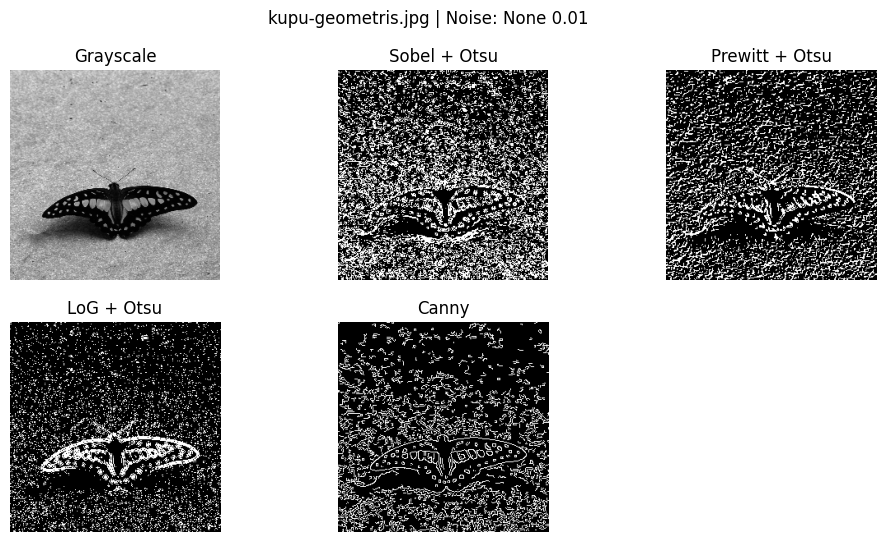

kupu-geometris.jpg | Noise: None 0.05
Sobel: MSE=20273.65, PSNR=5.06 dB
Prewitt: MSE=21491.27, PSNR=4.81 dB
LoG: MSE=23194.98, PSNR=4.48 dB
Canny: MSE=21861.61, PSNR=4.73 dB
--------------------------------------------------


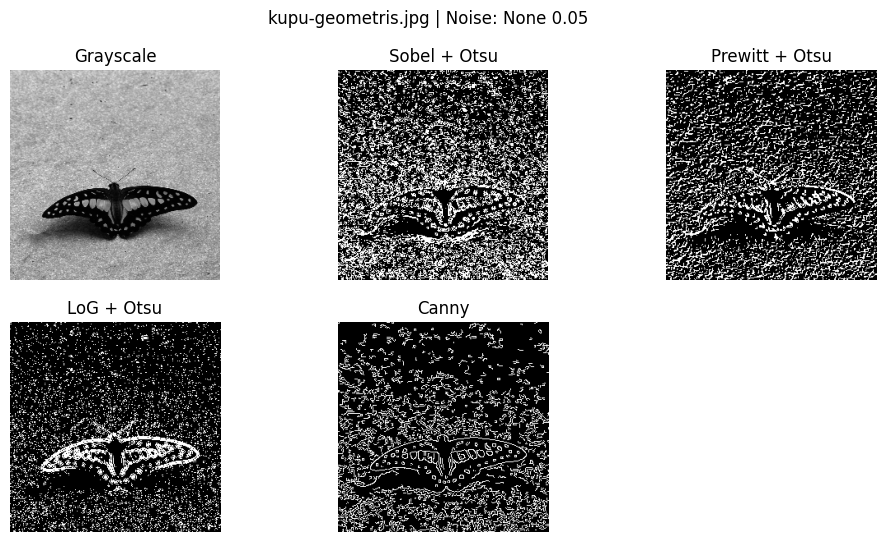

kupu-geometris.jpg | Noise: gaussian 0.01
Sobel: MSE=20259.78, PSNR=5.06 dB
Prewitt: MSE=21506.05, PSNR=4.81 dB
LoG: MSE=23102.66, PSNR=4.49 dB
Canny: MSE=21758.09, PSNR=4.75 dB
--------------------------------------------------


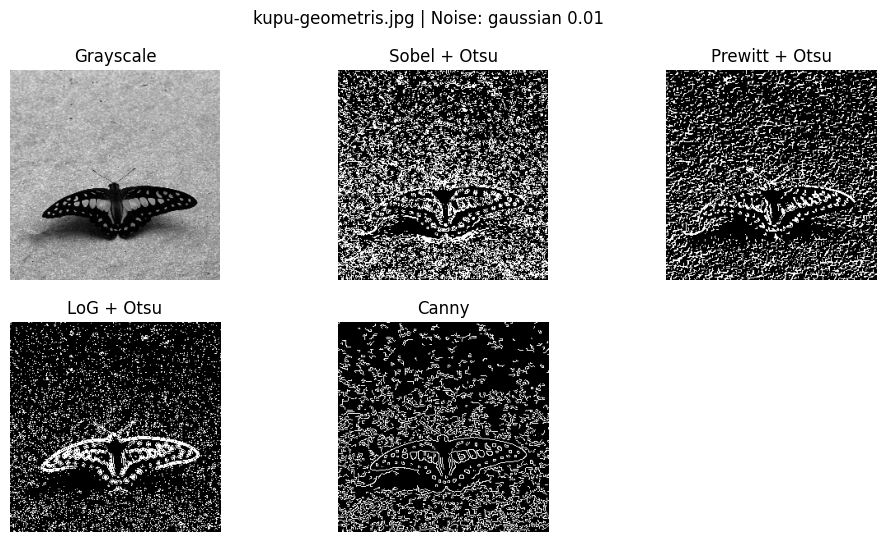

kupu-geometris.jpg | Noise: gaussian 0.05
Sobel: MSE=19540.88, PSNR=5.22 dB
Prewitt: MSE=20712.59, PSNR=4.97 dB
LoG: MSE=21969.45, PSNR=4.71 dB
Canny: MSE=20139.67, PSNR=5.09 dB
--------------------------------------------------


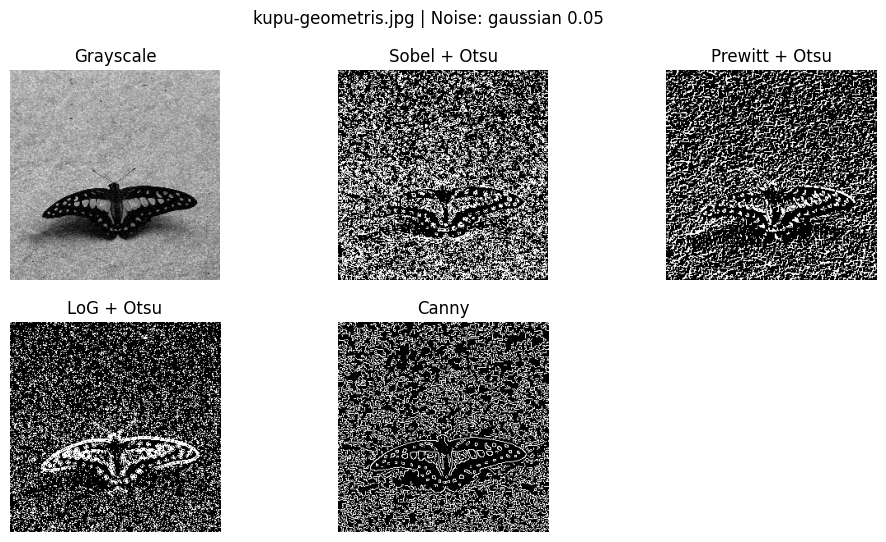

kupu-geometris.jpg | Noise: s&p 0.01
Sobel: MSE=20741.86, PSNR=4.96 dB
Prewitt: MSE=22731.07, PSNR=4.56 dB
LoG: MSE=23639.94, PSNR=4.39 dB
Canny: MSE=21354.83, PSNR=4.84 dB
--------------------------------------------------


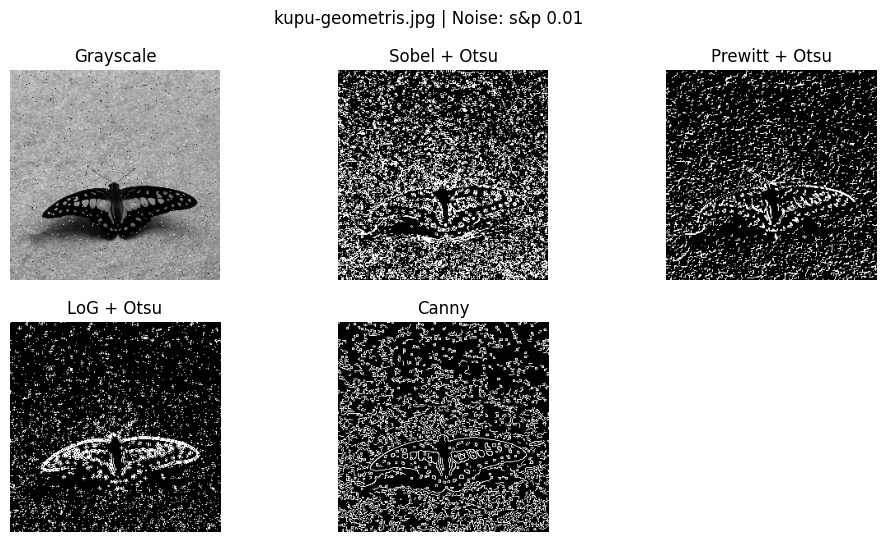

kupu-geometris.jpg | Noise: s&p 0.05
Sobel: MSE=20502.32, PSNR=5.01 dB
Prewitt: MSE=22168.44, PSNR=4.67 dB
LoG: MSE=23211.92, PSNR=4.47 dB
Canny: MSE=20045.14, PSNR=5.11 dB
--------------------------------------------------


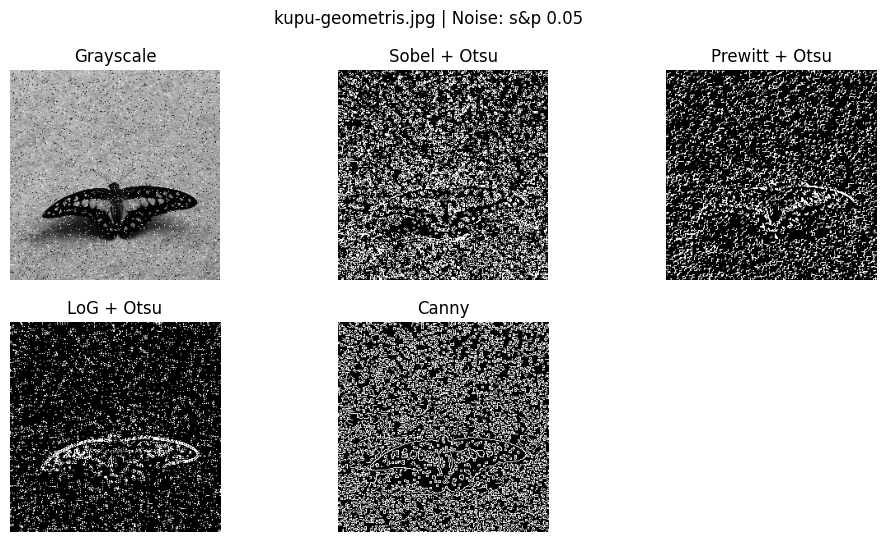

lidahbuaya-rumit.jpg | Noise: None 0.01
Sobel: MSE=16930.65, PSNR=5.84 dB
Prewitt: MSE=15005.36, PSNR=6.37 dB
LoG: MSE=13492.06, PSNR=6.83 dB
Canny: MSE=16209.75, PSNR=6.03 dB
--------------------------------------------------


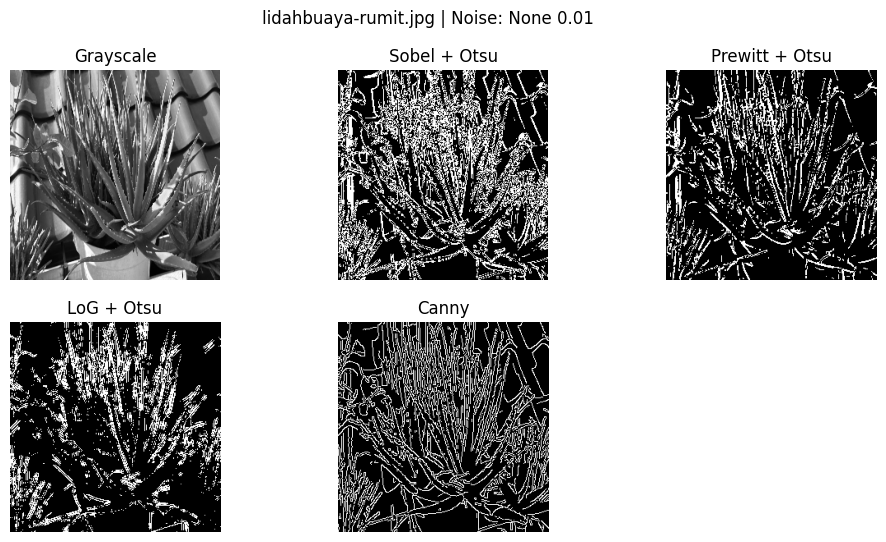

lidahbuaya-rumit.jpg | Noise: None 0.05
Sobel: MSE=16930.65, PSNR=5.84 dB
Prewitt: MSE=15005.36, PSNR=6.37 dB
LoG: MSE=13492.06, PSNR=6.83 dB
Canny: MSE=16209.75, PSNR=6.03 dB
--------------------------------------------------


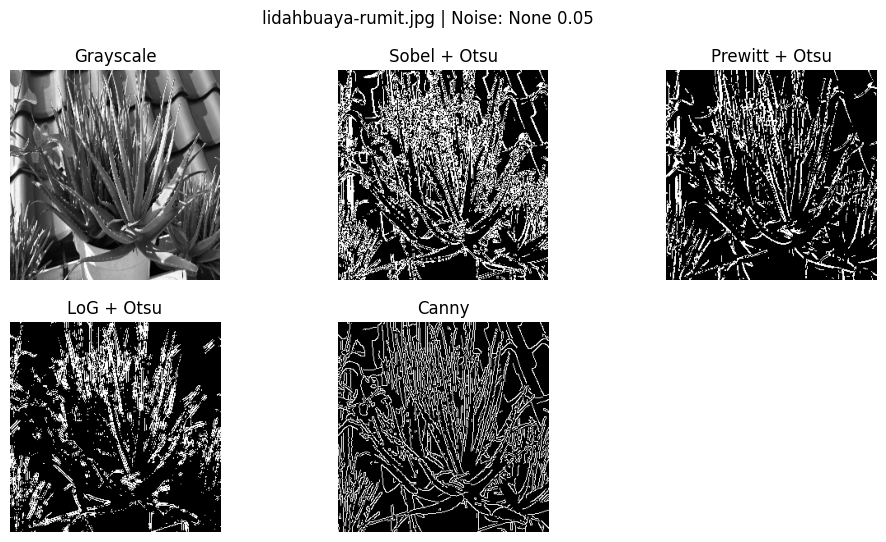

lidahbuaya-rumit.jpg | Noise: gaussian 0.01
Sobel: MSE=16883.13, PSNR=5.86 dB
Prewitt: MSE=14983.92, PSNR=6.37 dB
LoG: MSE=13510.32, PSNR=6.82 dB
Canny: MSE=16210.20, PSNR=6.03 dB
--------------------------------------------------


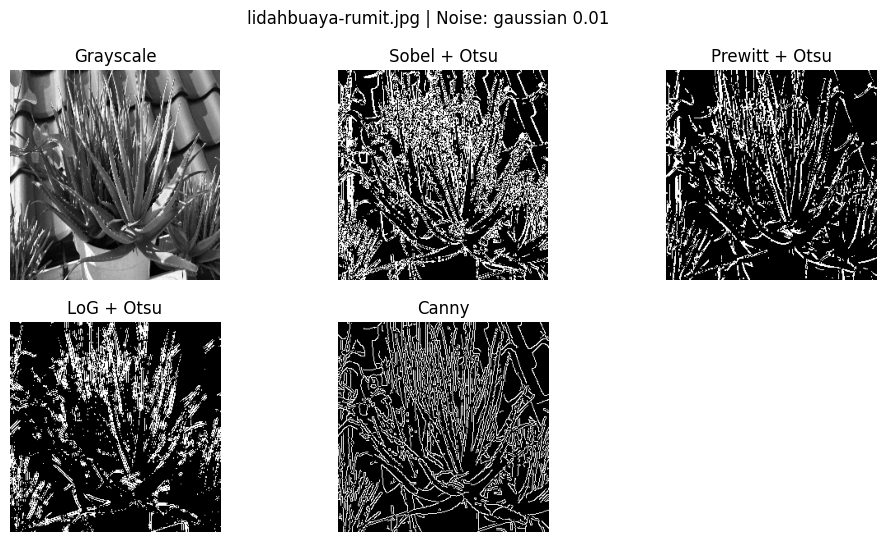

lidahbuaya-rumit.jpg | Noise: gaussian 0.05
Sobel: MSE=17339.39, PSNR=5.74 dB
Prewitt: MSE=15272.70, PSNR=6.29 dB
LoG: MSE=13676.61, PSNR=6.77 dB
Canny: MSE=17075.30, PSNR=5.81 dB
--------------------------------------------------


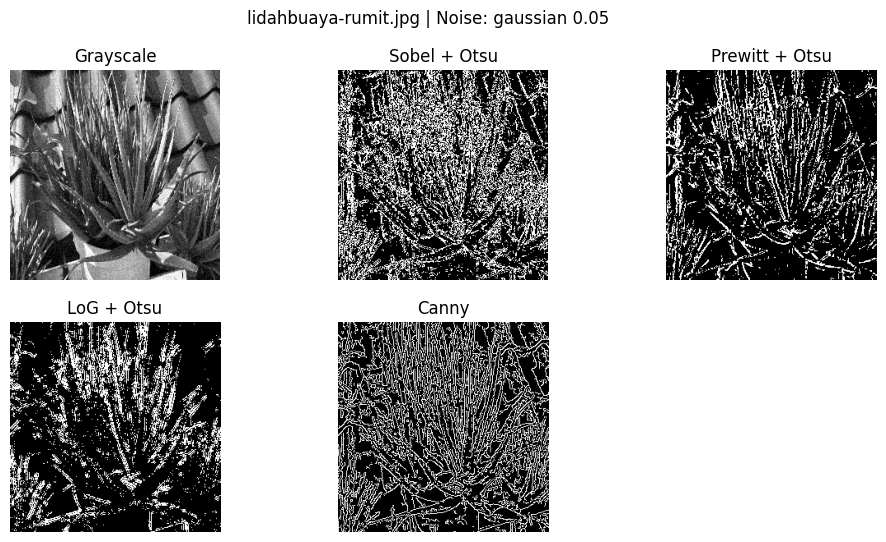

lidahbuaya-rumit.jpg | Noise: s&p 0.01
Sobel: MSE=17107.33, PSNR=5.80 dB
Prewitt: MSE=15179.37, PSNR=6.32 dB
LoG: MSE=13759.41, PSNR=6.74 dB
Canny: MSE=16598.97, PSNR=5.93 dB
--------------------------------------------------


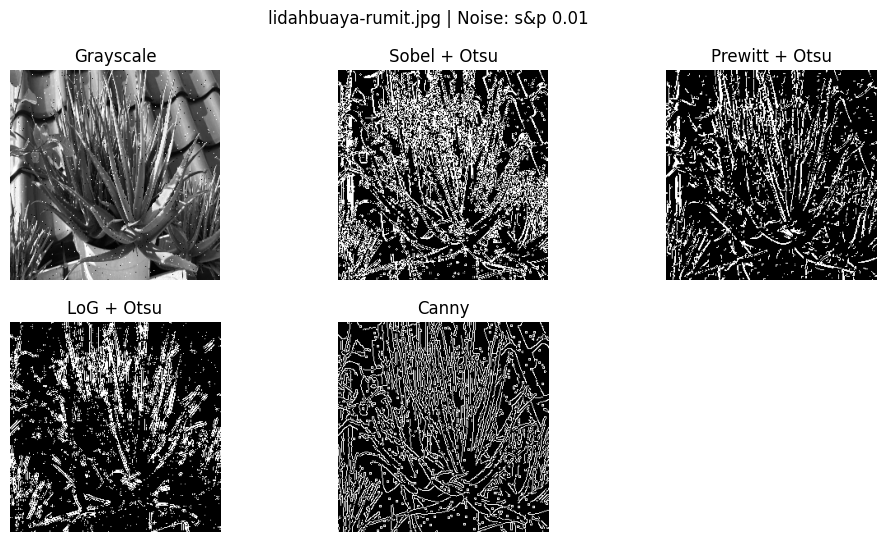

lidahbuaya-rumit.jpg | Noise: s&p 0.05
Sobel: MSE=17715.96, PSNR=5.65 dB
Prewitt: MSE=15904.43, PSNR=6.12 dB
LoG: MSE=14263.21, PSNR=6.59 dB
Canny: MSE=17909.44, PSNR=5.60 dB
--------------------------------------------------


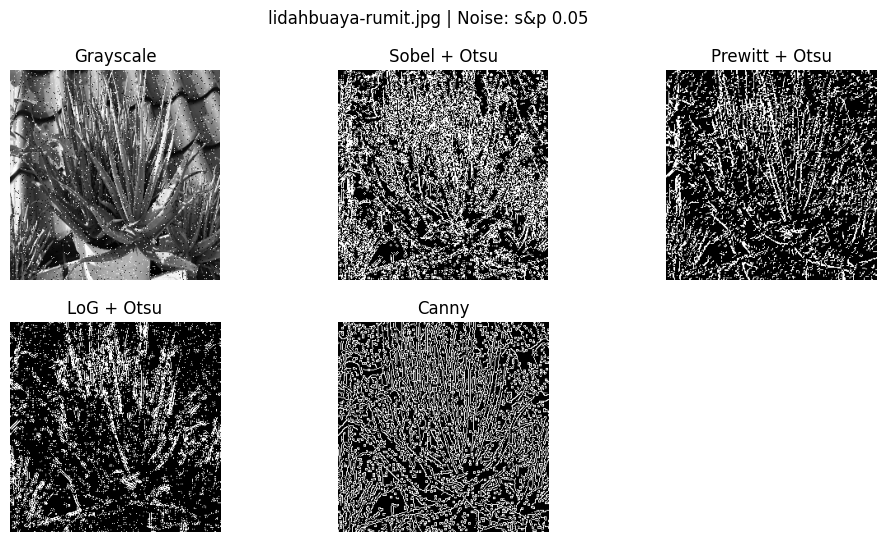

tang-gelap.jpg | Noise: None 0.01
Sobel: MSE=2384.18, PSNR=14.36 dB
Prewitt: MSE=1497.48, PSNR=16.38 dB
LoG: MSE=2313.87, PSNR=14.49 dB
Canny: MSE=337.15, PSNR=22.85 dB
--------------------------------------------------


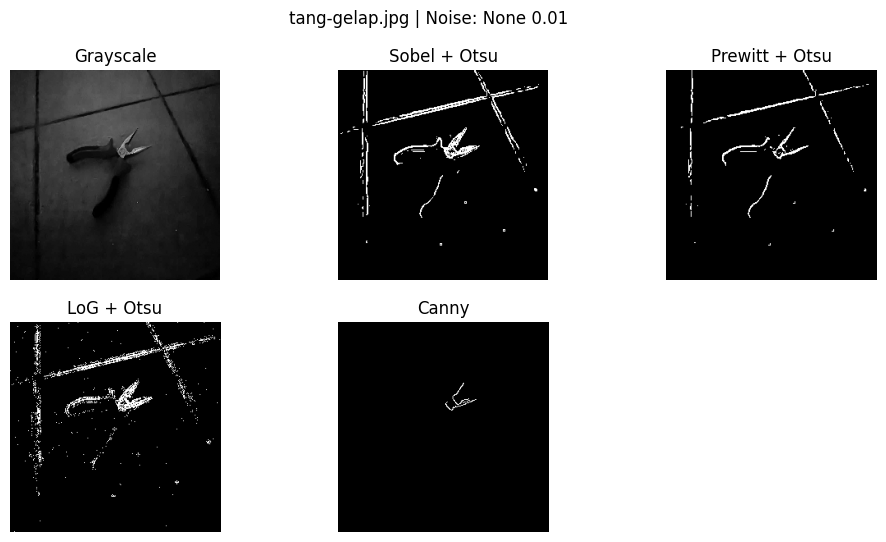

tang-gelap.jpg | Noise: None 0.05
Sobel: MSE=2384.18, PSNR=14.36 dB
Prewitt: MSE=1497.48, PSNR=16.38 dB
LoG: MSE=2313.87, PSNR=14.49 dB
Canny: MSE=337.15, PSNR=22.85 dB
--------------------------------------------------


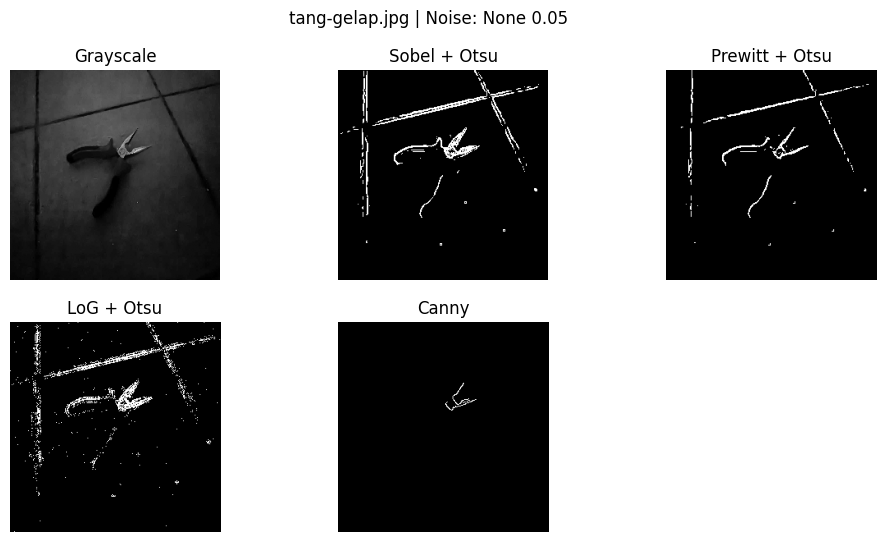

tang-gelap.jpg | Noise: gaussian 0.01
Sobel: MSE=2025.59, PSNR=15.07 dB
Prewitt: MSE=1510.31, PSNR=16.34 dB
LoG: MSE=15381.45, PSNR=6.26 dB
Canny: MSE=334.10, PSNR=22.89 dB
--------------------------------------------------


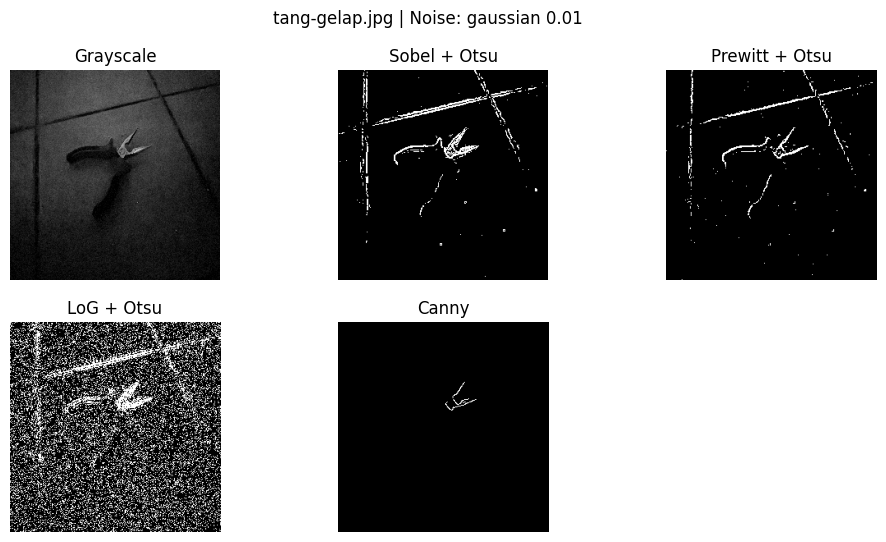

tang-gelap.jpg | Noise: gaussian 0.05
Sobel: MSE=21090.68, PSNR=4.89 dB
Prewitt: MSE=19469.79, PSNR=5.24 dB
LoG: MSE=16383.20, PSNR=5.99 dB
Canny: MSE=628.55, PSNR=20.15 dB
--------------------------------------------------


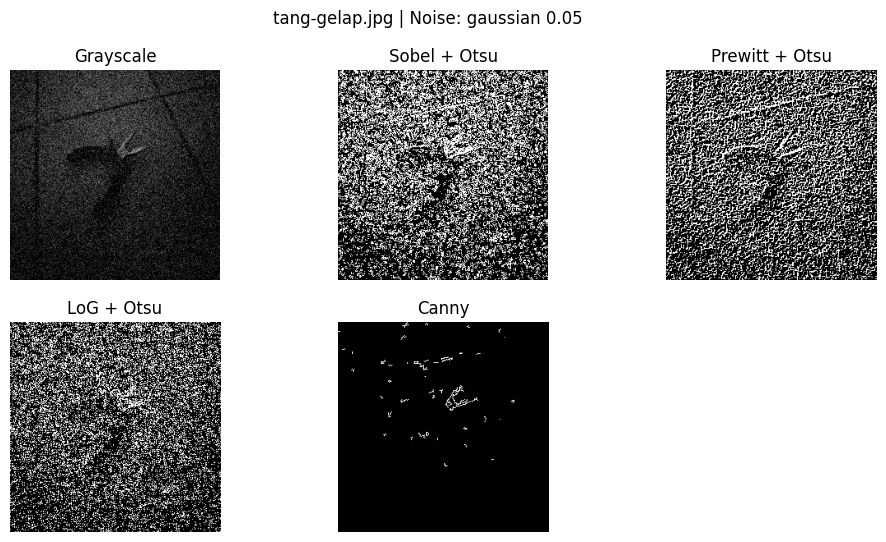

tang-gelap.jpg | Noise: s&p 0.01
Sobel: MSE=1375.77, PSNR=16.75 dB
Prewitt: MSE=1314.33, PSNR=16.94 dB
LoG: MSE=524.95, PSNR=20.93 dB
Canny: MSE=2350.97, PSNR=14.42 dB
--------------------------------------------------


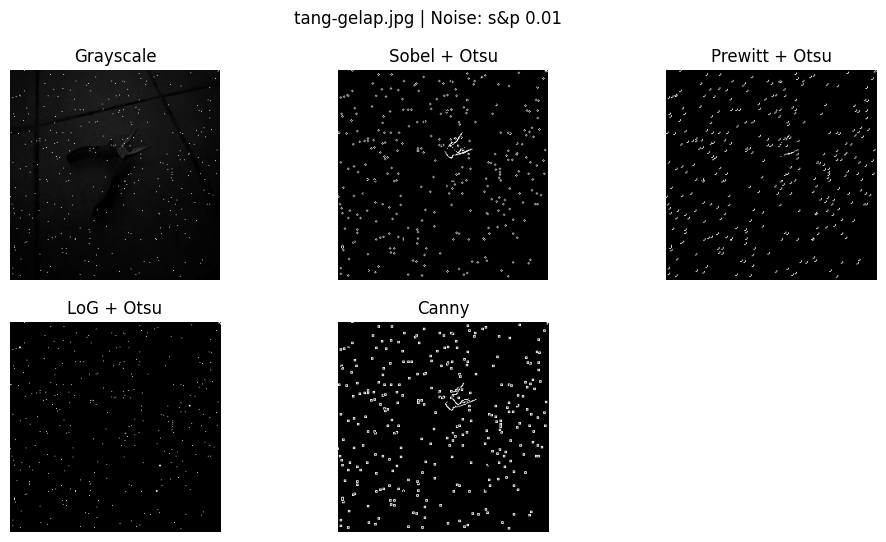

tang-gelap.jpg | Noise: s&p 0.05
Sobel: MSE=5296.15, PSNR=10.89 dB
Prewitt: MSE=5225.22, PSNR=10.95 dB
LoG: MSE=2054.27, PSNR=15.00 dB
Canny: MSE=8886.79, PSNR=8.64 dB
--------------------------------------------------


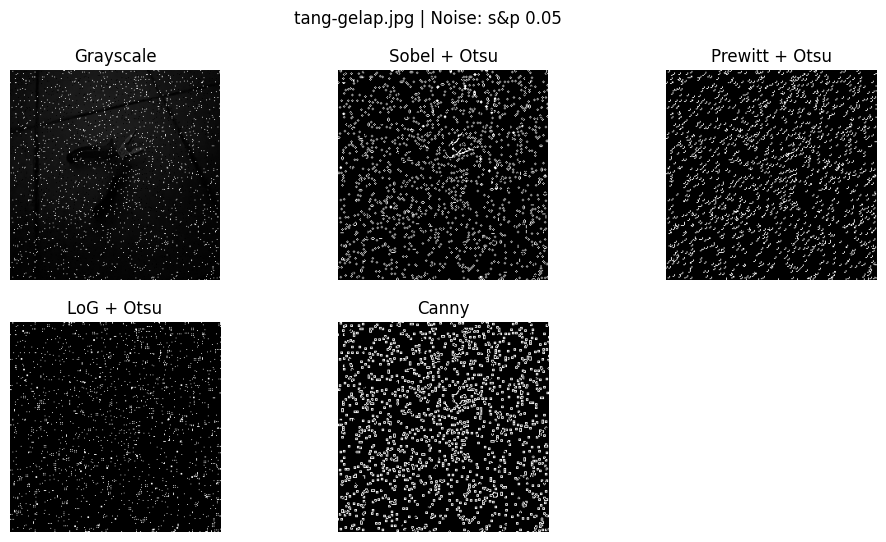

telur-lengkung.jpg | Noise: None 0.01
Sobel: MSE=11788.65, PSNR=7.42 dB
Prewitt: MSE=12555.10, PSNR=7.14 dB
LoG: MSE=12097.54, PSNR=7.30 dB
Canny: MSE=12897.76, PSNR=7.03 dB
--------------------------------------------------


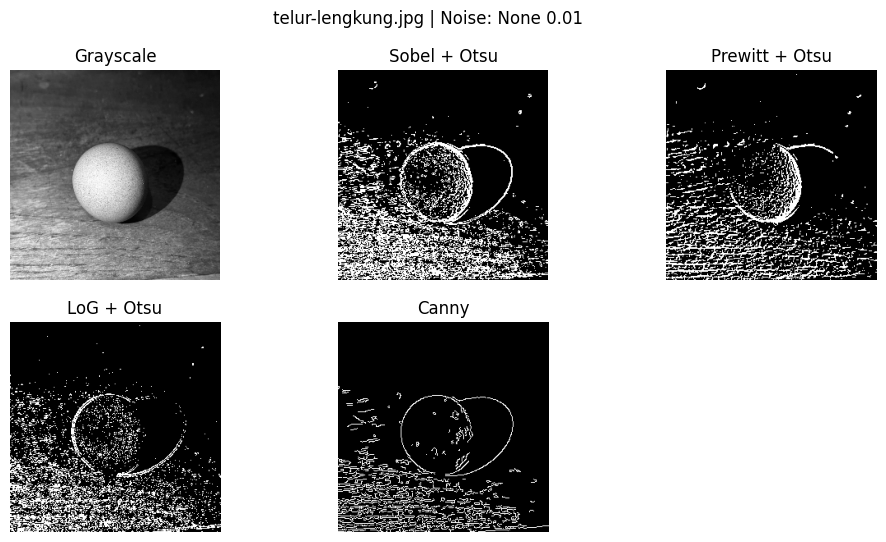

telur-lengkung.jpg | Noise: None 0.05
Sobel: MSE=11788.65, PSNR=7.42 dB
Prewitt: MSE=12555.10, PSNR=7.14 dB
LoG: MSE=12097.54, PSNR=7.30 dB
Canny: MSE=12897.76, PSNR=7.03 dB
--------------------------------------------------


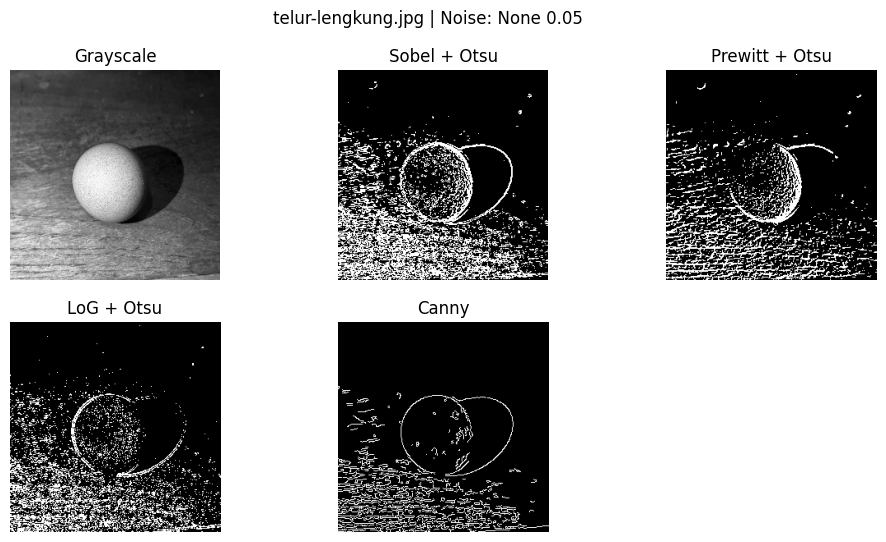

telur-lengkung.jpg | Noise: gaussian 0.01
Sobel: MSE=11865.00, PSNR=7.39 dB
Prewitt: MSE=12583.19, PSNR=7.13 dB
LoG: MSE=12091.70, PSNR=7.31 dB
Canny: MSE=12831.61, PSNR=7.05 dB
--------------------------------------------------


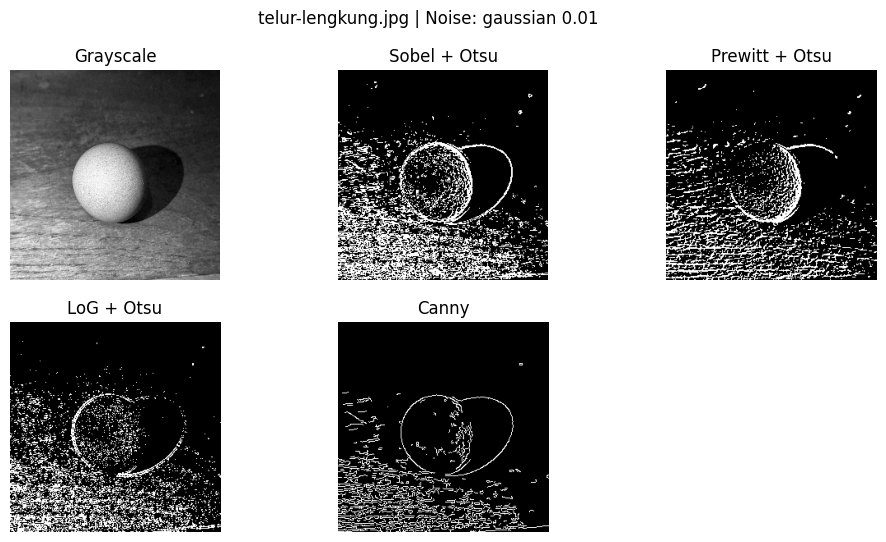

telur-lengkung.jpg | Noise: gaussian 0.05
Sobel: MSE=14010.76, PSNR=6.67 dB
Prewitt: MSE=14937.79, PSNR=6.39 dB
LoG: MSE=14376.58, PSNR=6.55 dB
Canny: MSE=12996.42, PSNR=6.99 dB
--------------------------------------------------


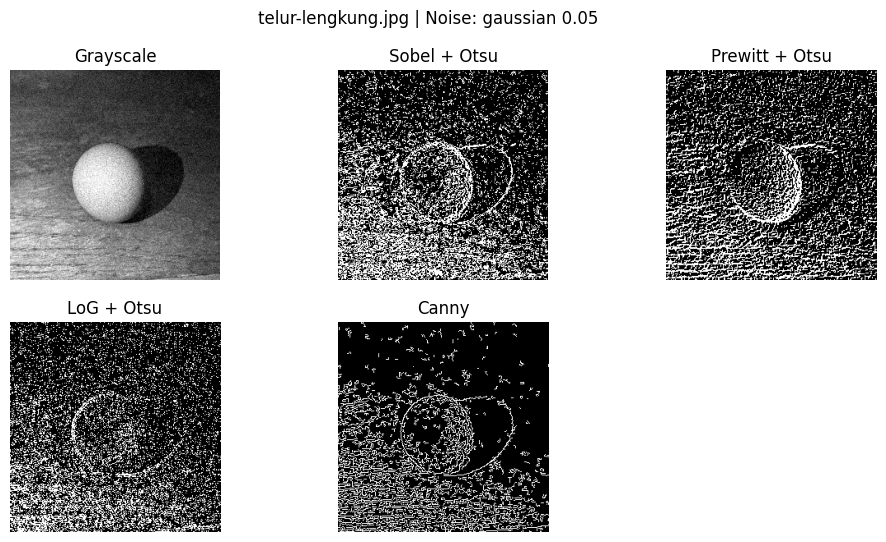

telur-lengkung.jpg | Noise: s&p 0.01
Sobel: MSE=12735.59, PSNR=7.08 dB
Prewitt: MSE=13479.06, PSNR=6.83 dB
LoG: MSE=13617.15, PSNR=6.79 dB
Canny: MSE=13575.96, PSNR=6.80 dB
--------------------------------------------------


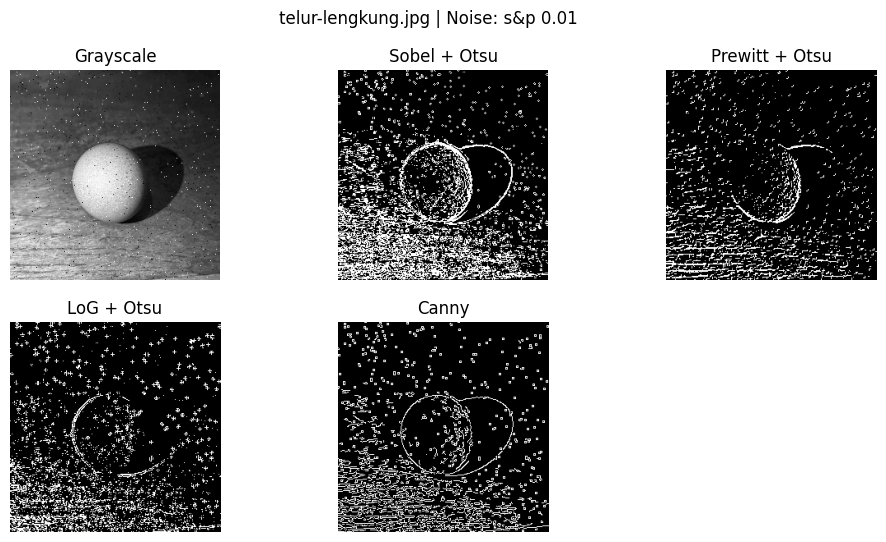

telur-lengkung.jpg | Noise: s&p 0.05
Sobel: MSE=14949.81, PSNR=6.38 dB
Prewitt: MSE=14864.42, PSNR=6.41 dB
LoG: MSE=14313.07, PSNR=6.57 dB
Canny: MSE=15912.37, PSNR=6.11 dB
--------------------------------------------------


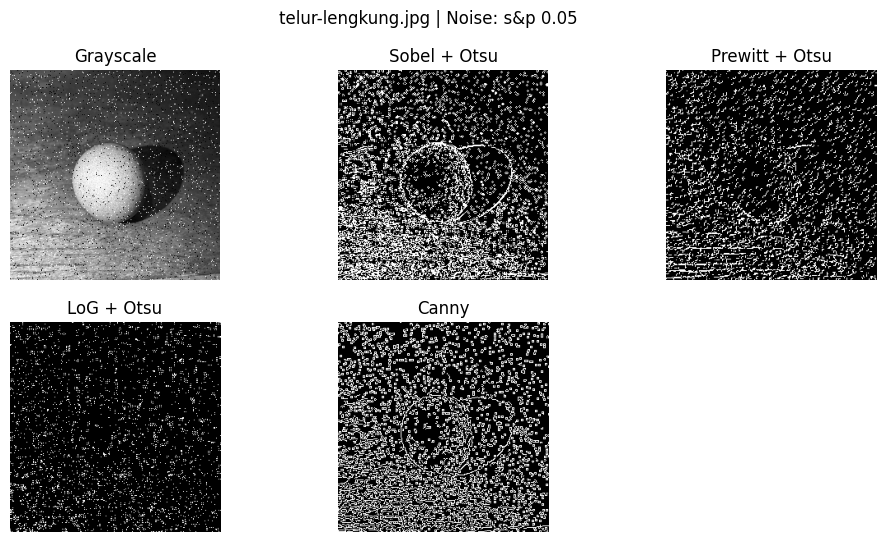

ijuk-thinline.jpg | Noise: None 0.01
Sobel: MSE=13285.68, PSNR=6.90 dB
Prewitt: MSE=12124.76, PSNR=7.29 dB
LoG: MSE=13008.06, PSNR=6.99 dB
Canny: MSE=12293.79, PSNR=7.23 dB
--------------------------------------------------


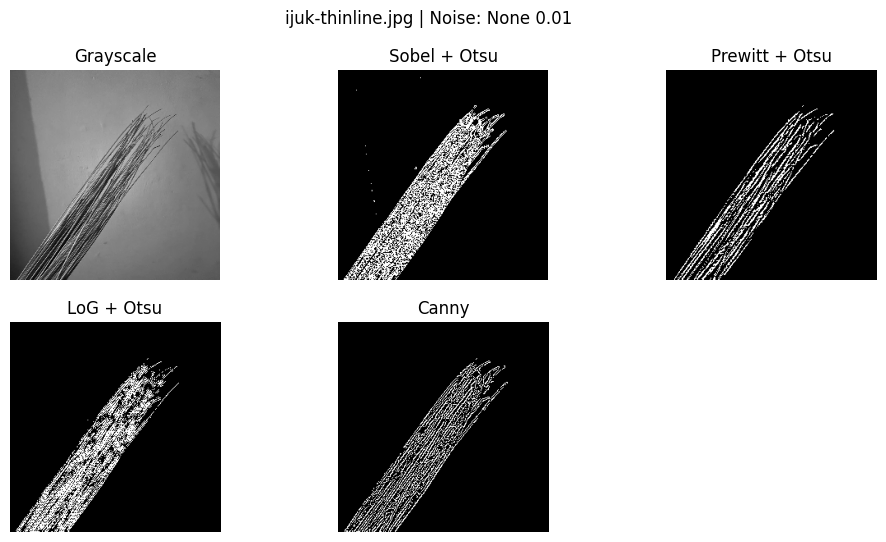

ijuk-thinline.jpg | Noise: None 0.05
Sobel: MSE=13285.68, PSNR=6.90 dB
Prewitt: MSE=12124.76, PSNR=7.29 dB
LoG: MSE=13008.06, PSNR=6.99 dB
Canny: MSE=12293.79, PSNR=7.23 dB
--------------------------------------------------


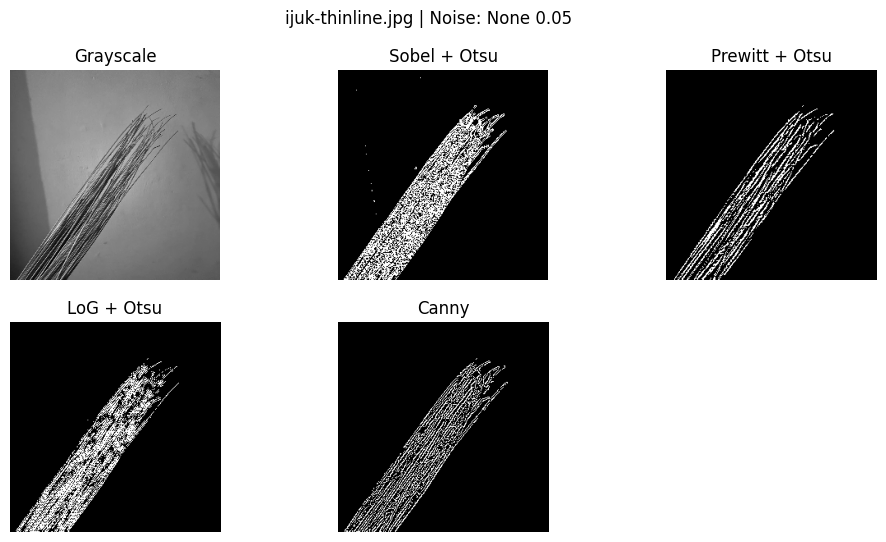

ijuk-thinline.jpg | Noise: gaussian 0.01
Sobel: MSE=13199.98, PSNR=6.93 dB
Prewitt: MSE=12126.58, PSNR=7.29 dB
LoG: MSE=12930.52, PSNR=7.01 dB
Canny: MSE=12283.04, PSNR=7.24 dB
--------------------------------------------------


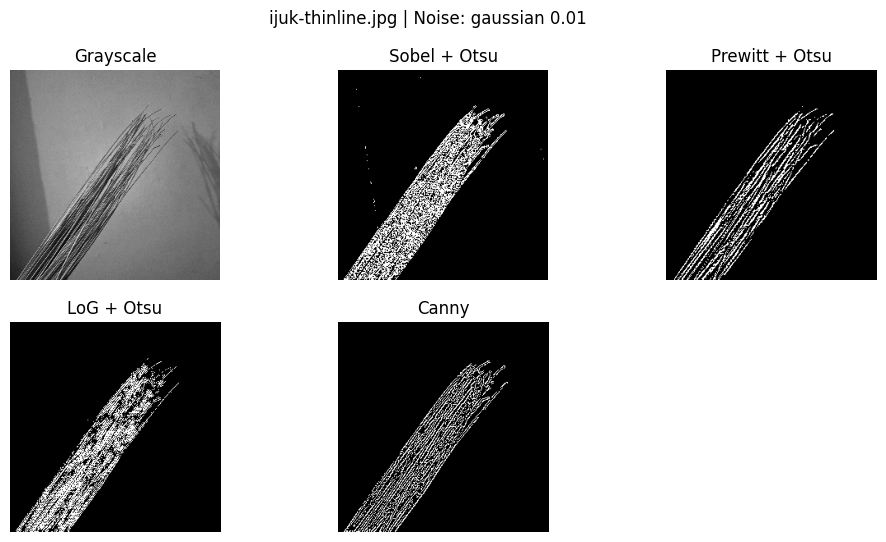

ijuk-thinline.jpg | Noise: gaussian 0.05
Sobel: MSE=14006.19, PSNR=6.67 dB
Prewitt: MSE=12554.32, PSNR=7.14 dB
LoG: MSE=12781.04, PSNR=7.07 dB
Canny: MSE=12512.12, PSNR=7.16 dB
--------------------------------------------------


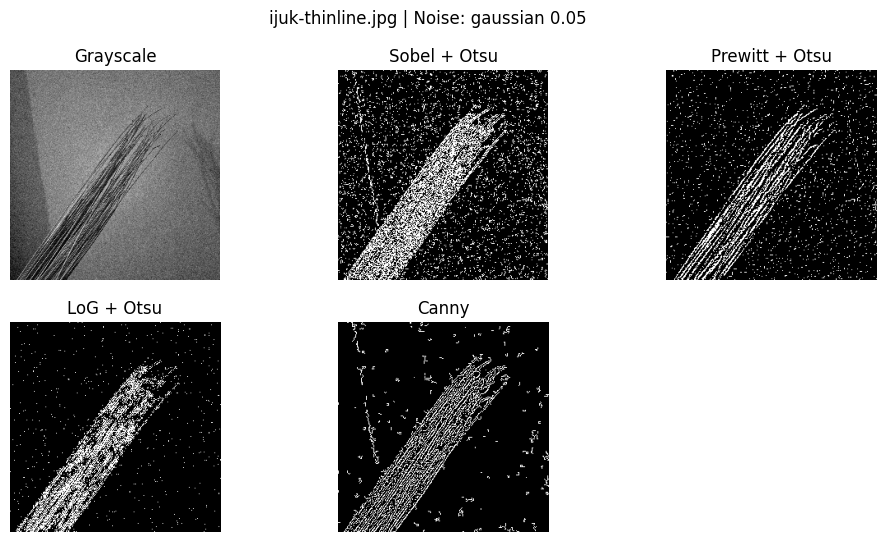

ijuk-thinline.jpg | Noise: s&p 0.01
Sobel: MSE=13719.17, PSNR=6.76 dB
Prewitt: MSE=12540.50, PSNR=7.15 dB
LoG: MSE=13067.04, PSNR=6.97 dB
Canny: MSE=12837.36, PSNR=7.05 dB
--------------------------------------------------


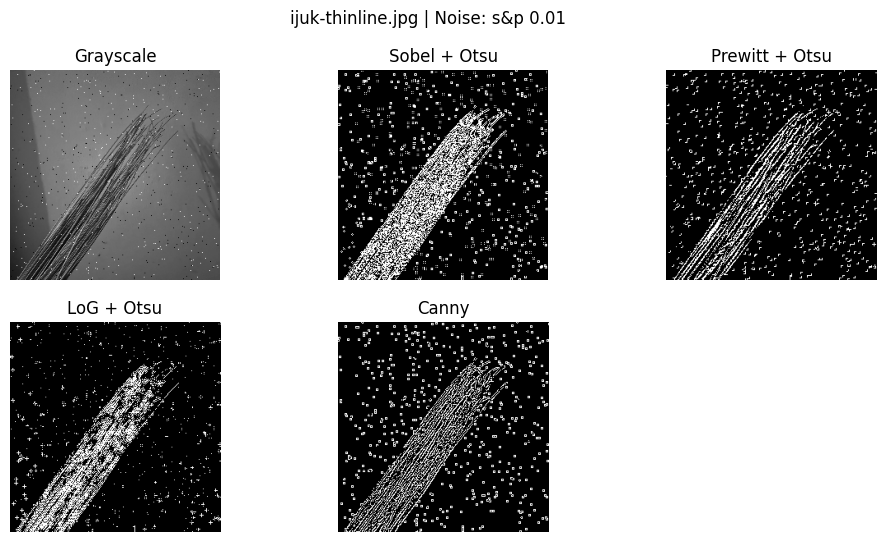

ijuk-thinline.jpg | Noise: s&p 0.05
Sobel: MSE=15350.63, PSNR=6.27 dB
Prewitt: MSE=14027.22, PSNR=6.66 dB
LoG: MSE=12992.72, PSNR=6.99 dB
Canny: MSE=14590.01, PSNR=6.49 dB
--------------------------------------------------


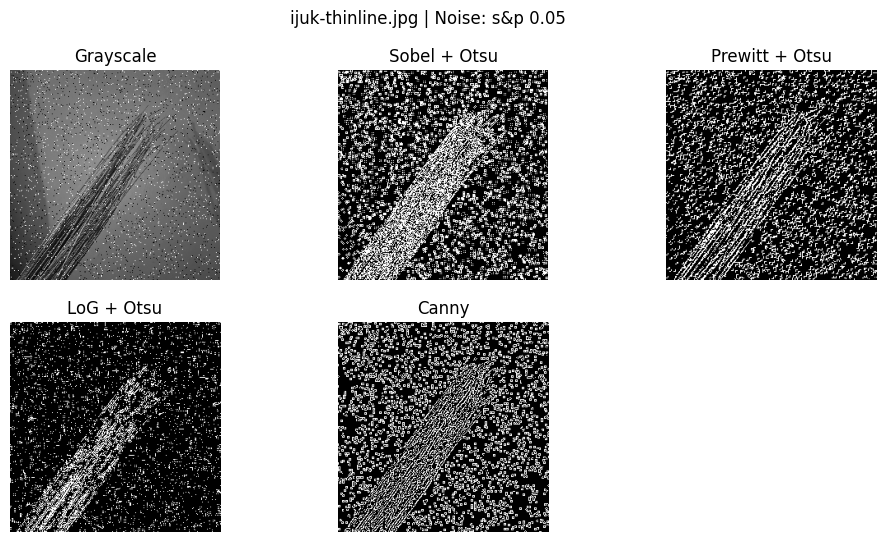

In [13]:
# Loop semua gambar + noise + operator

# Loop semua gambar dan noise
noise_levels = [0.01, 0.05]  # bisa ditambah 0.1 dst.
noise_types = [None, 'gaussian', 's&p']

for file in image_files:
    path = os.path.join(image_folder, file)
    original = preprocess_image(path, noise_type=None)  # citra asli grayscale

    for noise_type in noise_types:
        for noise_amount in noise_levels:
            # Citra dengan noise
            gray = preprocess_image(path, noise_type=noise_type, noise_amount=noise_amount)
            
            # Operator
            sobel = sobel_edge(gray)
            prewitt = prewitt_edge(gray)
            log = log_edge(gray)
            canny = canny_edge(gray)

            # Thresholding untuk non-Canny
            sobel_bin = otsu_threshold(sobel)
            prewitt_bin = otsu_threshold(prewitt)
            log_bin = otsu_threshold(log)

            # Hitung MSE & PSNR
            mse_sobel, psnr_sobel = calculate_mse_psnr(original, sobel_bin)
            mse_prewitt, psnr_prewitt = calculate_mse_psnr(original, prewitt_bin)
            mse_log, psnr_log = calculate_mse_psnr(original, log_bin)
            mse_canny, psnr_canny = calculate_mse_psnr(original, canny)  # Canny langsung biner

            print(f"{file} | Noise: {noise_type} {noise_amount}")
            print(f"Sobel: MSE={mse_sobel:.2f}, PSNR={psnr_sobel:.2f} dB")
            print(f"Prewitt: MSE={mse_prewitt:.2f}, PSNR={psnr_prewitt:.2f} dB")
            print(f"LoG: MSE={mse_log:.2f}, PSNR={psnr_log:.2f} dB")
            print(f"Canny: MSE={mse_canny:.2f}, PSNR={psnr_canny:.2f} dB")
            print("-"*50)

            # Tampilkan hasil visual (opsional)
            plt.figure(figsize=(12,6))
            plt.suptitle(f"{file} | Noise: {noise_type} {noise_amount}")
            plt.subplot(2,3,1), plt.imshow(gray, cmap='gray'), plt.title('Grayscale'), plt.axis('off')
            plt.subplot(2,3,2), plt.imshow(sobel_bin, cmap='gray'), plt.title('Sobel + Otsu'), plt.axis('off')
            plt.subplot(2,3,3), plt.imshow(prewitt_bin, cmap='gray'), plt.title('Prewitt + Otsu'), plt.axis('off')
            plt.subplot(2,3,4), plt.imshow(log_bin, cmap='gray'), plt.title('LoG + Otsu'), plt.axis('off')
            plt.subplot(2,3,5), plt.imshow(canny, cmap='gray'), plt.title('Canny'), plt.axis('off')
            plt.show()

kupu-geometris.jpg | Tanpa Noise
Sobel: MSE=20273.65, PSNR=5.06 dB
Prewitt: MSE=21491.27, PSNR=4.81 dB
LoG: MSE=23194.98, PSNR=4.48 dB
Canny: MSE=21861.61, PSNR=4.73 dB
--------------------------------------------------
Gambar disimpan: output gambar\kupu-geometris_biasa.png


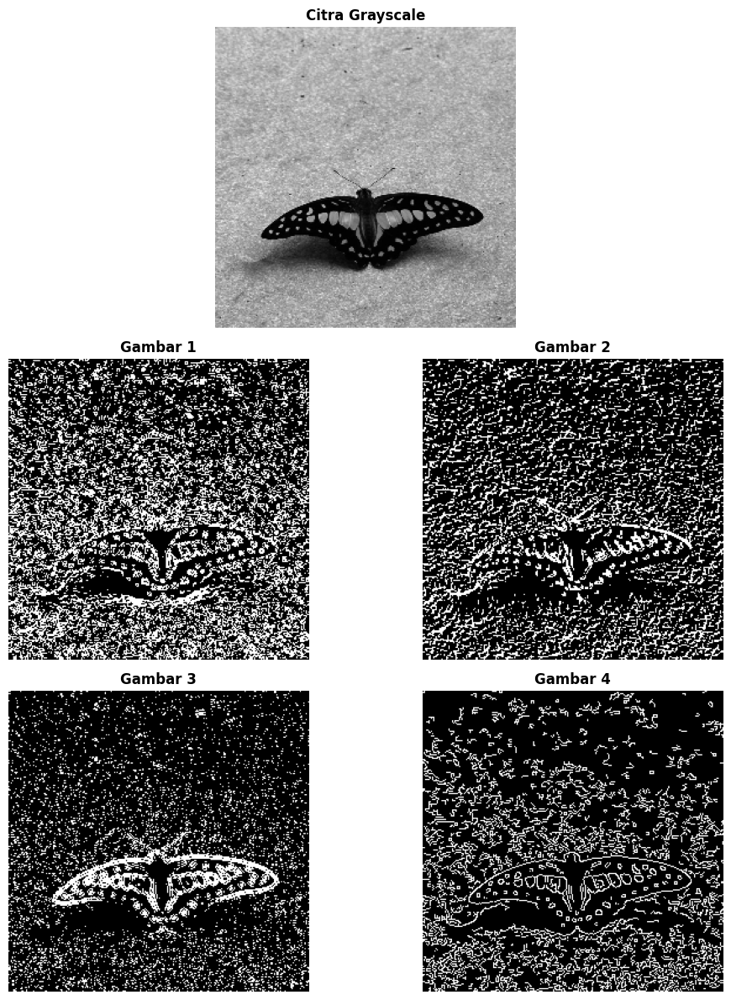

kupu-geometris.jpg | Noise: Salt & Pepper 0.01
Sobel: MSE=20727.79, PSNR=4.97 dB
Prewitt: MSE=22687.62, PSNR=4.57 dB
LoG: MSE=23682.82, PSNR=4.39 dB
Canny: MSE=21169.19, PSNR=4.87 dB
--------------------------------------------------
Gambar disimpan: output gambar\kupu-geometris_sp_noise001.png


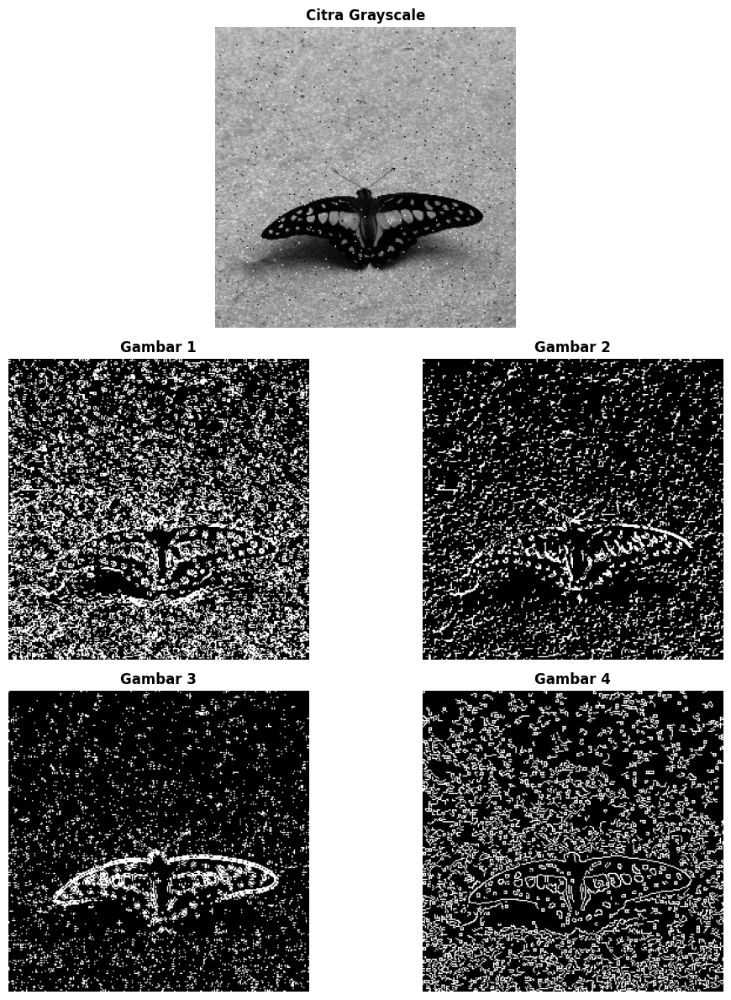

kupu-geometris.jpg | Noise: Salt & Pepper 0.05
Sobel: MSE=20508.47, PSNR=5.01 dB
Prewitt: MSE=22104.09, PSNR=4.69 dB
LoG: MSE=23205.53, PSNR=4.47 dB
Canny: MSE=20011.32, PSNR=5.12 dB
--------------------------------------------------
Gambar disimpan: output gambar\kupu-geometris_sp_noise005.png


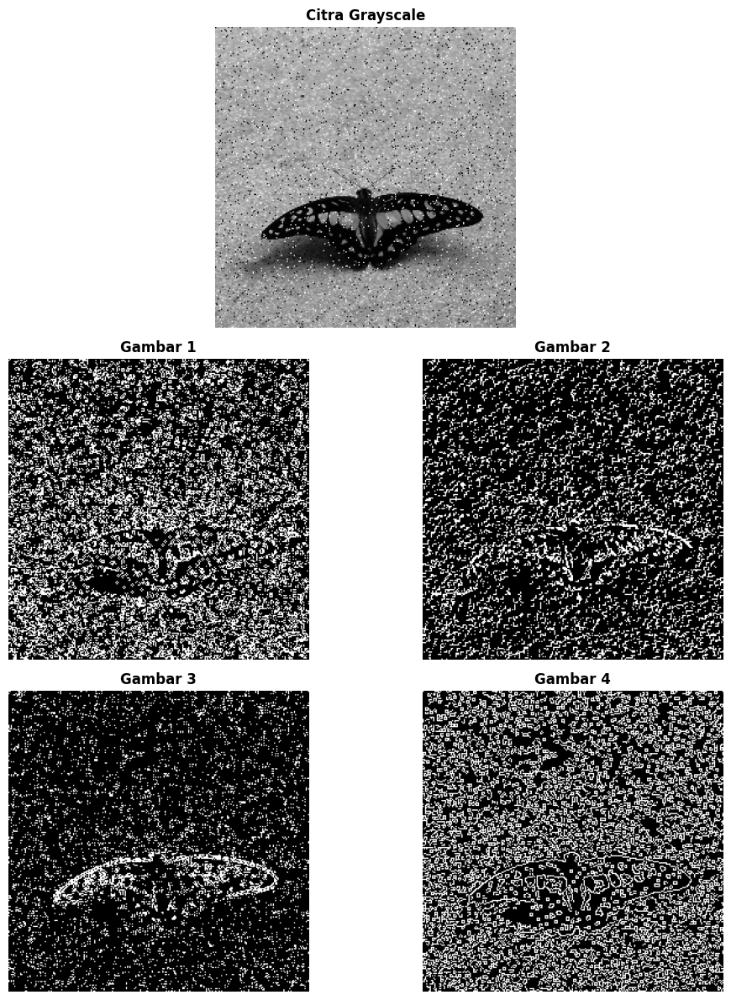

lidahbuaya-rumit.jpg | Tanpa Noise
Sobel: MSE=16930.65, PSNR=5.84 dB
Prewitt: MSE=15005.36, PSNR=6.37 dB
LoG: MSE=13492.06, PSNR=6.83 dB
Canny: MSE=16209.75, PSNR=6.03 dB
--------------------------------------------------
Gambar disimpan: output gambar\lidahbuaya-rumit_biasa.png


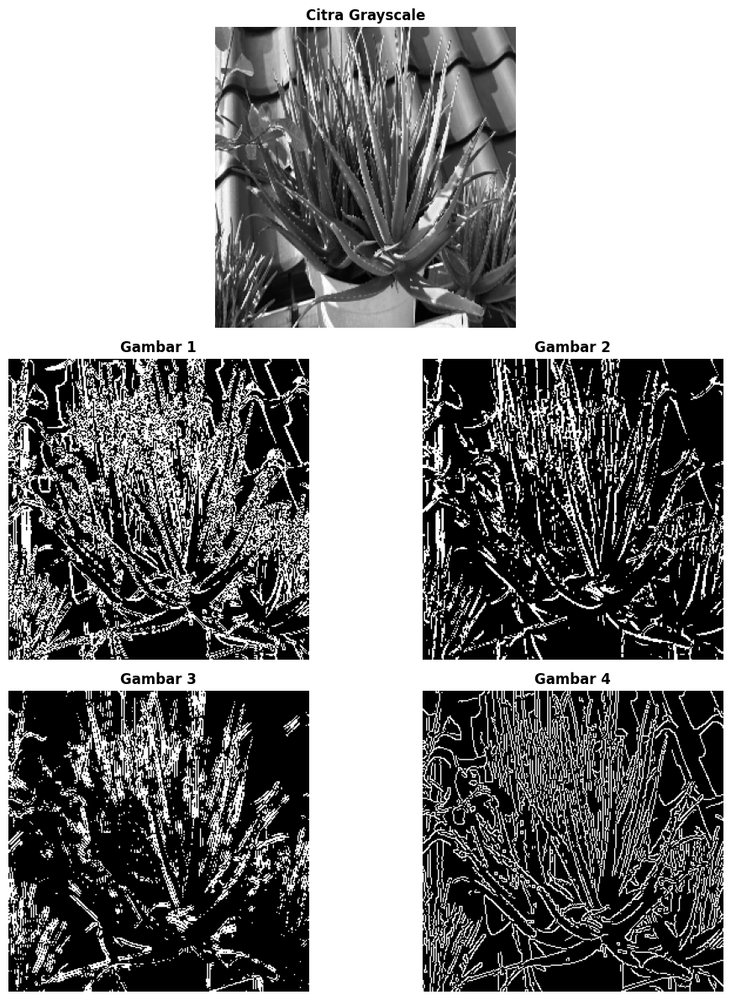

lidahbuaya-rumit.jpg | Noise: Salt & Pepper 0.01
Sobel: MSE=17103.34, PSNR=5.80 dB
Prewitt: MSE=15169.61, PSNR=6.32 dB
LoG: MSE=13708.14, PSNR=6.76 dB
Canny: MSE=16573.18, PSNR=5.94 dB
--------------------------------------------------
Gambar disimpan: output gambar\lidahbuaya-rumit_sp_noise001.png


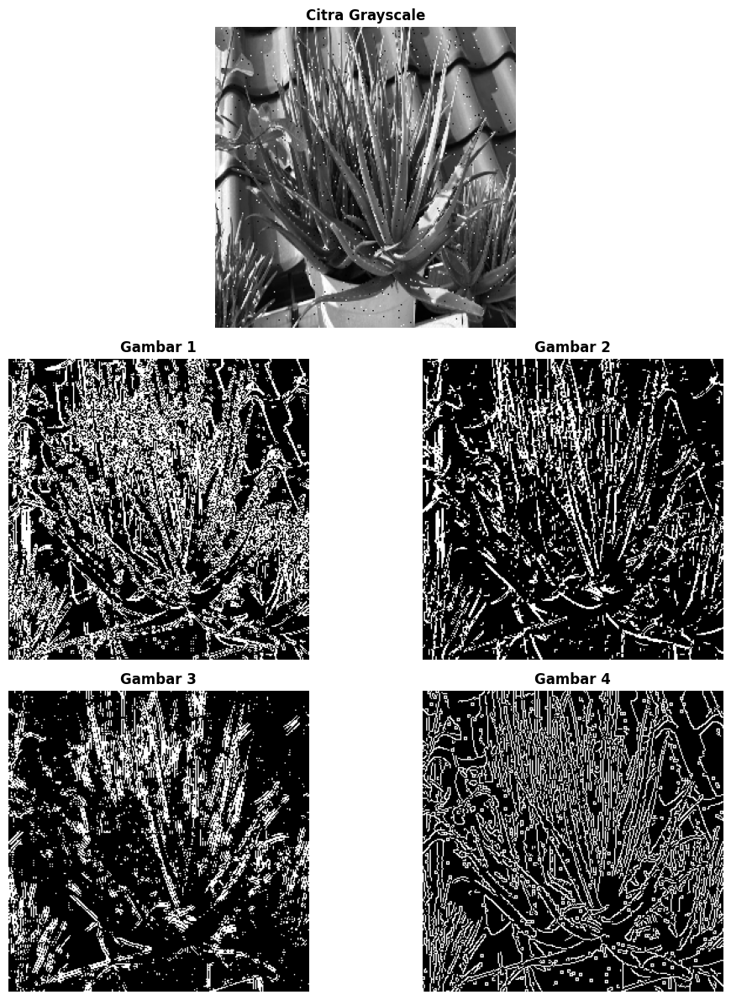

lidahbuaya-rumit.jpg | Noise: Salt & Pepper 0.05
Sobel: MSE=17822.31, PSNR=5.62 dB
Prewitt: MSE=15993.90, PSNR=6.09 dB
LoG: MSE=14208.24, PSNR=6.61 dB
Canny: MSE=17837.22, PSNR=5.62 dB
--------------------------------------------------
Gambar disimpan: output gambar\lidahbuaya-rumit_sp_noise005.png


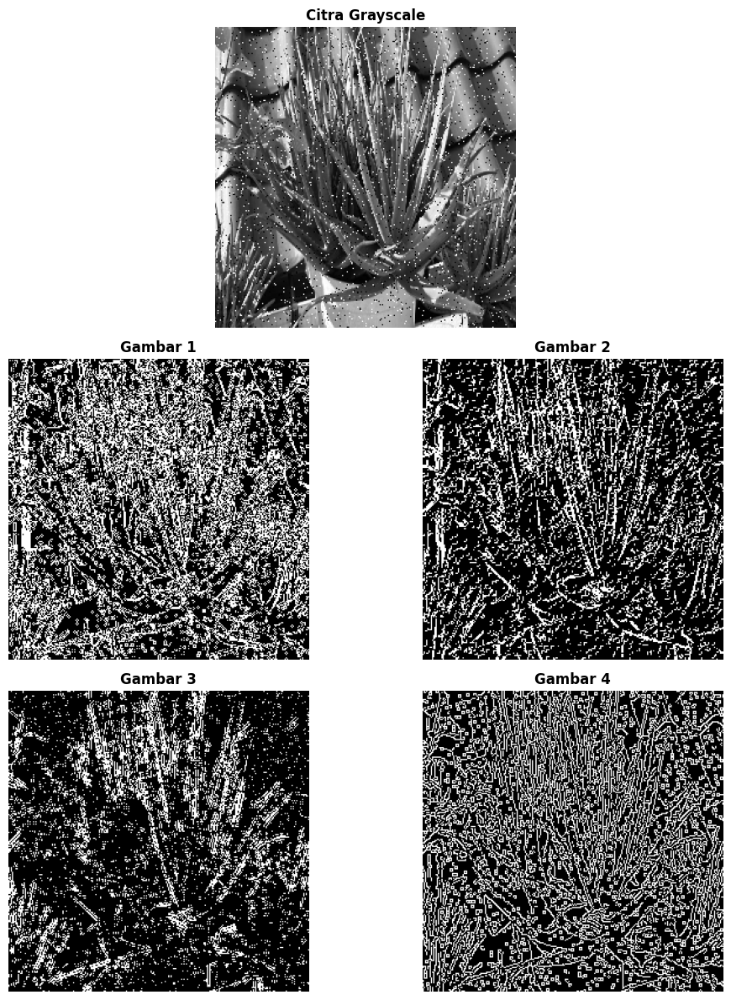

tang-gelap.jpg | Tanpa Noise
Sobel: MSE=2384.18, PSNR=14.36 dB
Prewitt: MSE=1497.48, PSNR=16.38 dB
LoG: MSE=2313.87, PSNR=14.49 dB
Canny: MSE=337.15, PSNR=22.85 dB
--------------------------------------------------
Gambar disimpan: output gambar\tang-gelap_biasa.png


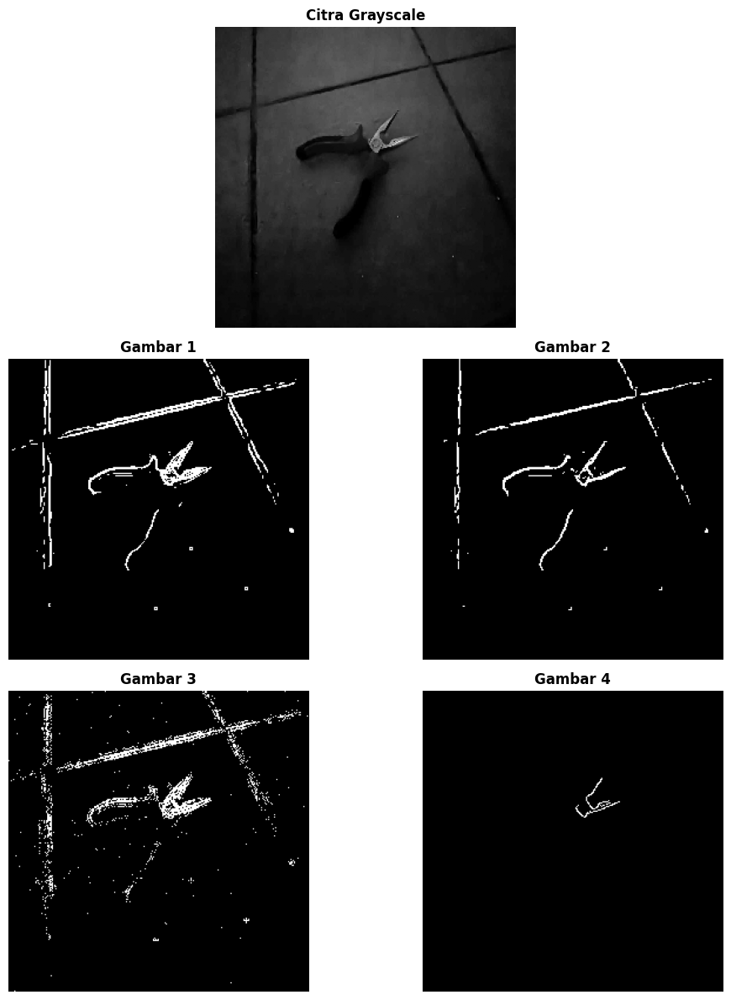

tang-gelap.jpg | Noise: Salt & Pepper 0.01
Sobel: MSE=1394.73, PSNR=16.69 dB
Prewitt: MSE=1320.79, PSNR=16.92 dB
LoG: MSE=533.66, PSNR=20.86 dB
Canny: MSE=2402.28, PSNR=14.32 dB
--------------------------------------------------
Gambar disimpan: output gambar\tang-gelap_sp_noise001.png


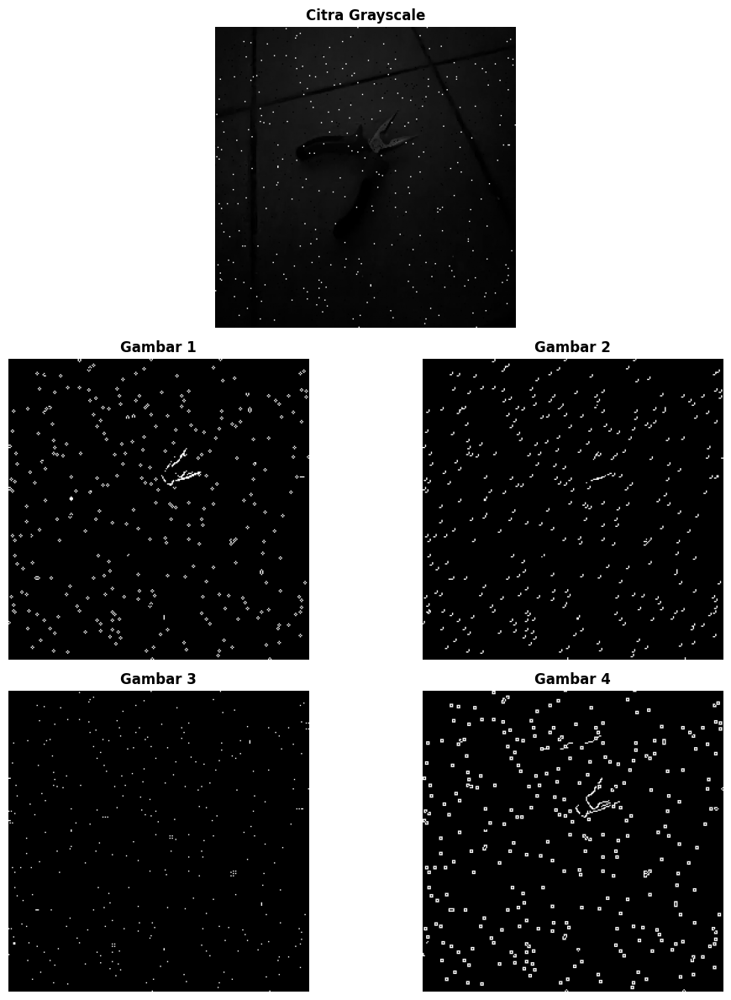

tang-gelap.jpg | Noise: Salt & Pepper 0.05
Sobel: MSE=5530.39, PSNR=10.70 dB
Prewitt: MSE=5485.78, PSNR=10.74 dB
LoG: MSE=2163.13, PSNR=14.78 dB
Canny: MSE=9245.93, PSNR=8.47 dB
--------------------------------------------------
Gambar disimpan: output gambar\tang-gelap_sp_noise005.png


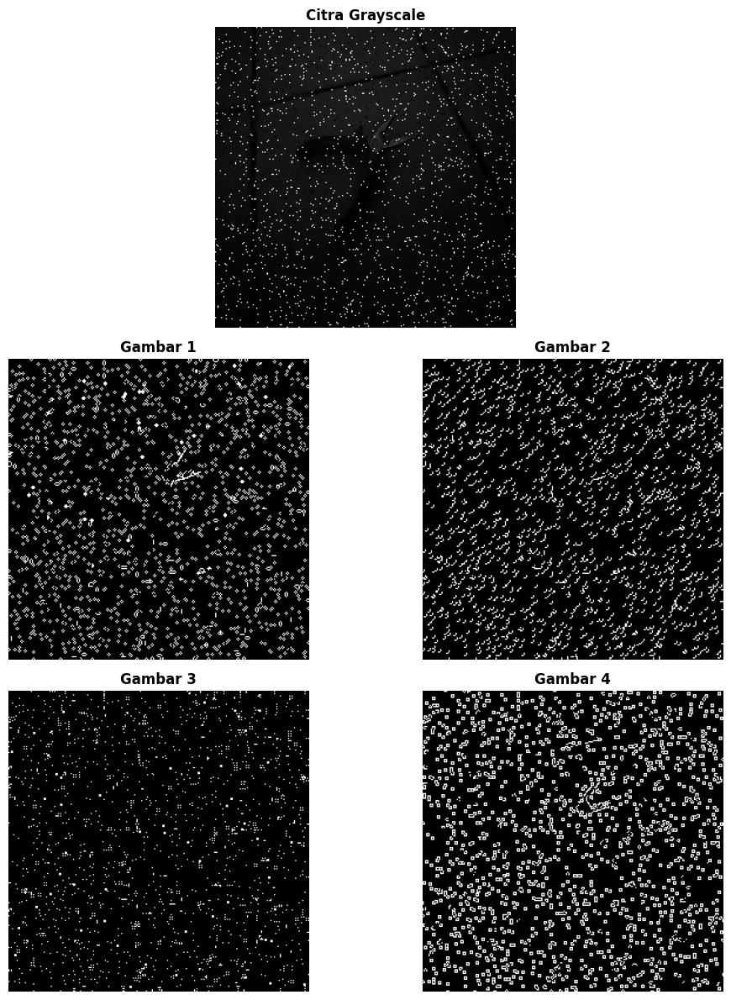

telur-lengkung.jpg | Tanpa Noise
Sobel: MSE=11788.65, PSNR=7.42 dB
Prewitt: MSE=12555.10, PSNR=7.14 dB
LoG: MSE=12097.54, PSNR=7.30 dB
Canny: MSE=12897.76, PSNR=7.03 dB
--------------------------------------------------
Gambar disimpan: output gambar\telur-lengkung_biasa.png


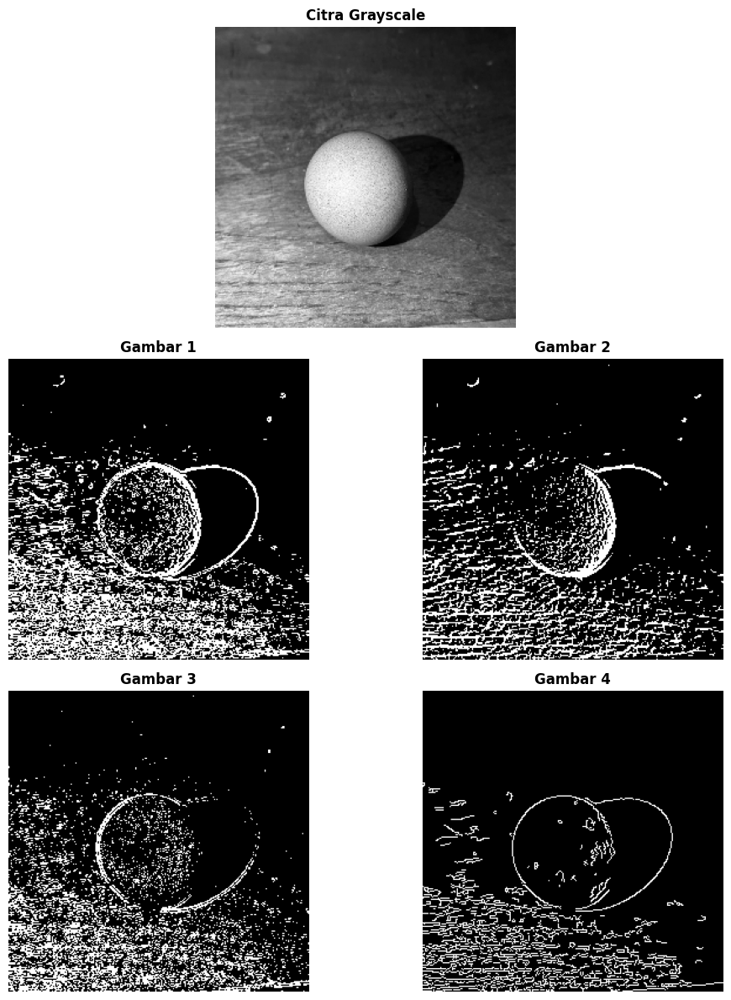

telur-lengkung.jpg | Noise: Salt & Pepper 0.01
Sobel: MSE=12652.32, PSNR=7.11 dB
Prewitt: MSE=13381.77, PSNR=6.87 dB
LoG: MSE=13529.62, PSNR=6.82 dB
Canny: MSE=13441.38, PSNR=6.85 dB
--------------------------------------------------
Gambar disimpan: output gambar\telur-lengkung_sp_noise001.png


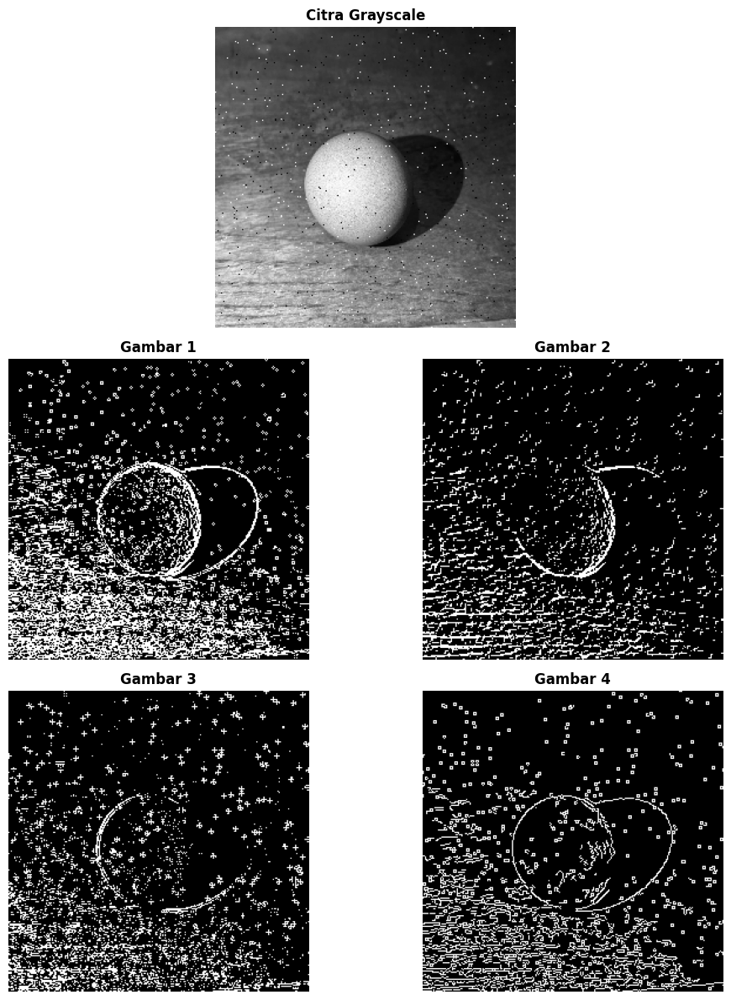

telur-lengkung.jpg | Noise: Salt & Pepper 0.05
Sobel: MSE=14855.57, PSNR=6.41 dB
Prewitt: MSE=14837.26, PSNR=6.42 dB
LoG: MSE=14326.69, PSNR=6.57 dB
Canny: MSE=15905.04, PSNR=6.12 dB
--------------------------------------------------
Gambar disimpan: output gambar\telur-lengkung_sp_noise005.png


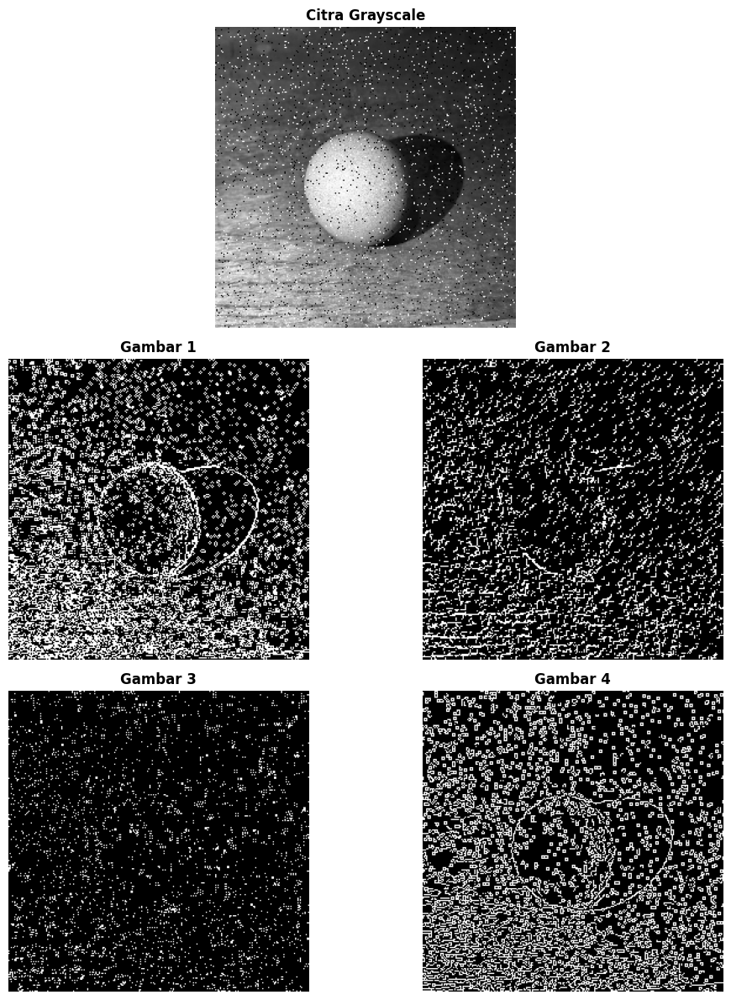

ijuk-thinline.jpg | Tanpa Noise
Sobel: MSE=13285.68, PSNR=6.90 dB
Prewitt: MSE=12124.76, PSNR=7.29 dB
LoG: MSE=13008.06, PSNR=6.99 dB
Canny: MSE=12293.79, PSNR=7.23 dB
--------------------------------------------------
Gambar disimpan: output gambar\ijuk-thinline_biasa.png


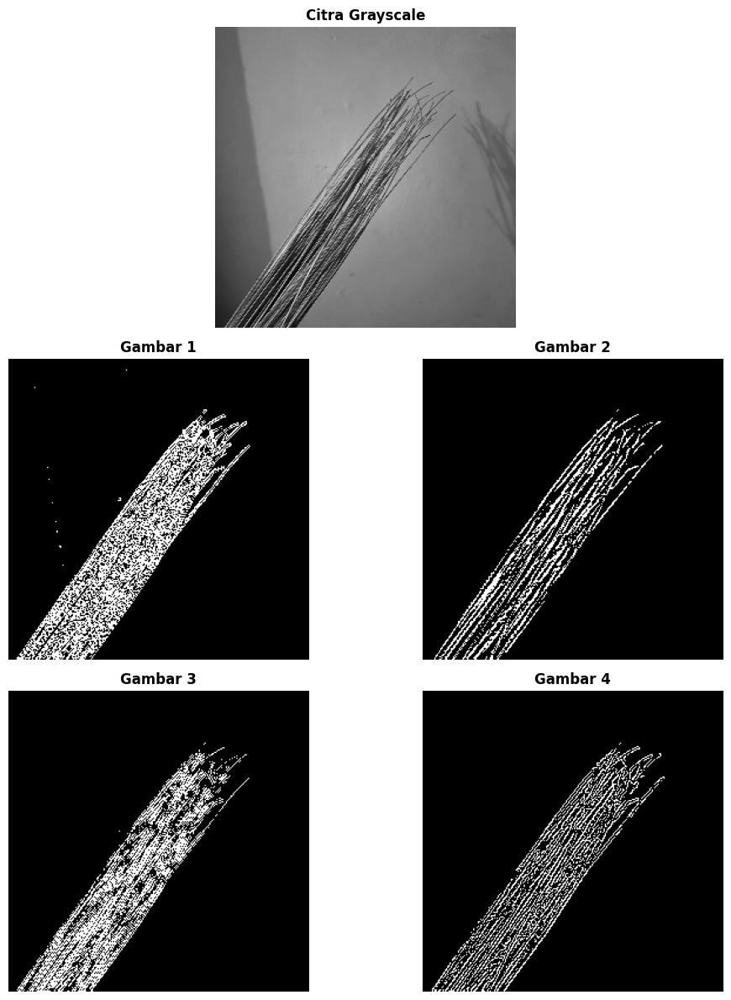

ijuk-thinline.jpg | Noise: Salt & Pepper 0.01
Sobel: MSE=13699.75, PSNR=6.76 dB
Prewitt: MSE=12558.48, PSNR=7.14 dB
LoG: MSE=13075.35, PSNR=6.97 dB
Canny: MSE=12863.01, PSNR=7.04 dB
--------------------------------------------------
Gambar disimpan: output gambar\ijuk-thinline_sp_noise001.png


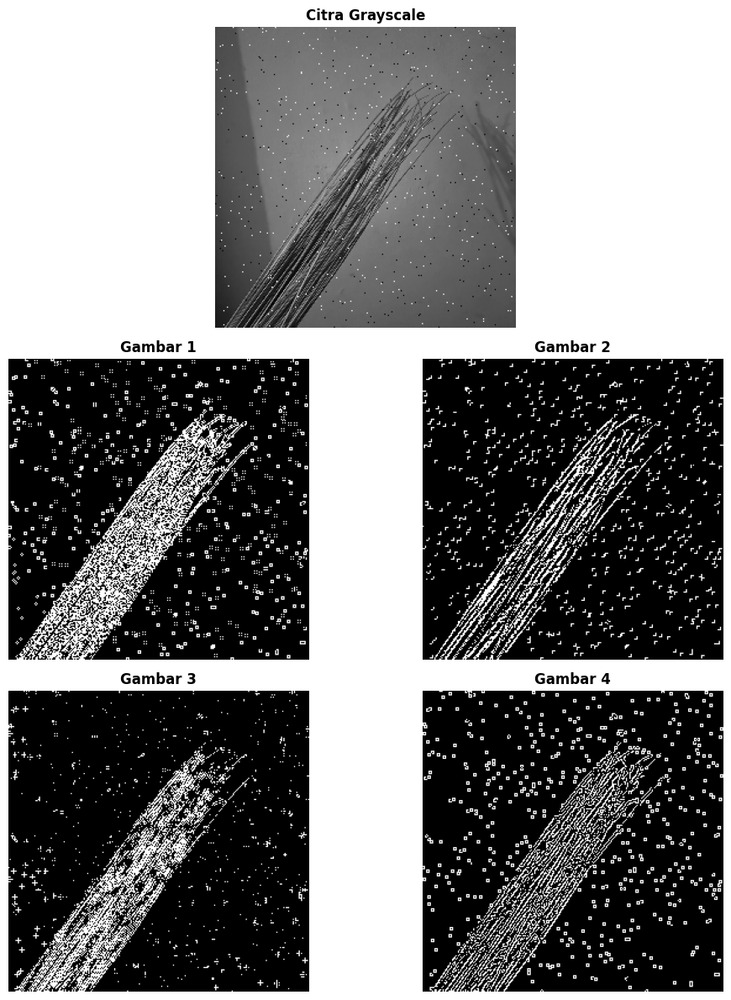

ijuk-thinline.jpg | Noise: Salt & Pepper 0.05
Sobel: MSE=15452.81, PSNR=6.24 dB
Prewitt: MSE=14055.59, PSNR=6.65 dB
LoG: MSE=12923.63, PSNR=7.02 dB
Canny: MSE=14585.41, PSNR=6.49 dB
--------------------------------------------------
Gambar disimpan: output gambar\ijuk-thinline_sp_noise005.png


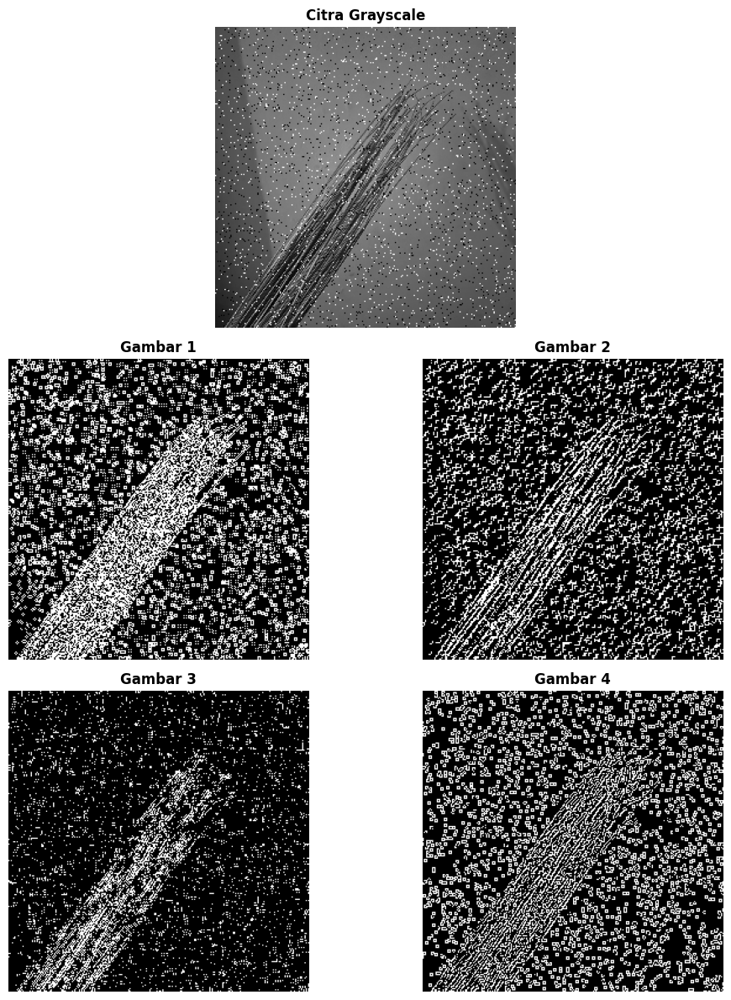

In [16]:
# Loop semua gambar + noise S&P + operator dengan layout 3 row dan simpan output

import os

# Buat folder output jika belum ada
output_folder = "output gambar"
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

noise_levels = [0.01, 0.05]

for file in image_files:
    path = os.path.join(image_folder, file)
    original = preprocess_image(path, noise_type=None)
    base_name = os.path.splitext(file)[0]

    # Proses tanpa noise
    gray = preprocess_image(path, noise_type=None)
    
    # Operator
    sobel = sobel_edge(gray)
    prewitt = prewitt_edge(gray)
    log = log_edge(gray)
    canny = canny_edge(gray)

    # Thresholding untuk non-Canny
    sobel_bin = otsu_threshold(sobel)
    prewitt_bin = otsu_threshold(prewitt)
    log_bin = otsu_threshold(log)

    # Hitung MSE & PSNR
    mse_sobel, psnr_sobel = calculate_mse_psnr(original, sobel_bin)
    mse_prewitt, psnr_prewitt = calculate_mse_psnr(original, prewitt_bin)
    mse_log, psnr_log = calculate_mse_psnr(original, log_bin)
    mse_canny, psnr_canny = calculate_mse_psnr(original, canny)

    print(f"{file} | Tanpa Noise")
    print(f"Sobel: MSE={mse_sobel:.2f}, PSNR={psnr_sobel:.2f} dB")
    print(f"Prewitt: MSE={mse_prewitt:.2f}, PSNR={psnr_prewitt:.2f} dB")
    print(f"LoG: MSE={mse_log:.2f}, PSNR={psnr_log:.2f} dB")
    print(f"Canny: MSE={mse_canny:.2f}, PSNR={psnr_canny:.2f} dB")
    print("-"*50)

    # Tampilkan hasil visual dengan layout 3 row
    fig = plt.figure(figsize=(10, 12))
    
    # Row 1: Citra Grayscale (tengah)
    ax1 = plt.subplot(3, 2, (1, 2))
    ax1.imshow(gray, cmap='gray')
    ax1.set_title('Citra Grayscale', fontweight='bold')
    ax1.axis('off')
    
    # Row 2: Gambar 1 dan Gambar 2
    plt.subplot(3, 2, 3)
    plt.imshow(sobel_bin, cmap='gray')
    plt.title('Gambar 1', fontweight='bold')
    plt.axis('off')
    
    plt.subplot(3, 2, 4)
    plt.imshow(prewitt_bin, cmap='gray')
    plt.title('Gambar 2', fontweight='bold')
    plt.axis('off')
    
    # Row 3: Gambar 3 dan Gambar 4
    plt.subplot(3, 2, 5)
    plt.imshow(log_bin, cmap='gray')
    plt.title('Gambar 3', fontweight='bold')
    plt.axis('off')
    
    plt.subplot(3, 2, 6)
    plt.imshow(canny, cmap='gray')
    plt.title('Gambar 4', fontweight='bold')
    plt.axis('off')
    
    plt.tight_layout()
    
    # Simpan gambar
    output_filename = f"{base_name}_biasa.png"
    output_path = os.path.join(output_folder, output_filename)
    plt.savefig(output_path, dpi=150, bbox_inches='tight')
    print(f"Gambar disimpan: {output_path}")
    
    plt.show()
    plt.close()

    # Proses dengan noise Salt & Pepper
    for noise_amount in noise_levels:
        gray = preprocess_image(path, noise_type='s&p', noise_amount=noise_amount)
        
        # Operator
        sobel = sobel_edge(gray)
        prewitt = prewitt_edge(gray)
        log = log_edge(gray)
        canny = canny_edge(gray)

        # Thresholding untuk non-Canny
        sobel_bin = otsu_threshold(sobel)
        prewitt_bin = otsu_threshold(prewitt)
        log_bin = otsu_threshold(log)

        # Hitung MSE & PSNR
        mse_sobel, psnr_sobel = calculate_mse_psnr(original, sobel_bin)
        mse_prewitt, psnr_prewitt = calculate_mse_psnr(original, prewitt_bin)
        mse_log, psnr_log = calculate_mse_psnr(original, log_bin)
        mse_canny, psnr_canny = calculate_mse_psnr(original, canny)

        print(f"{file} | Noise: Salt & Pepper {noise_amount}")
        print(f"Sobel: MSE={mse_sobel:.2f}, PSNR={psnr_sobel:.2f} dB")
        print(f"Prewitt: MSE={mse_prewitt:.2f}, PSNR={psnr_prewitt:.2f} dB")
        print(f"LoG: MSE={mse_log:.2f}, PSNR={psnr_log:.2f} dB")
        print(f"Canny: MSE={mse_canny:.2f}, PSNR={psnr_canny:.2f} dB")
        print("-"*50)

        # Tampilkan hasil visual dengan layout 3 row
        fig = plt.figure(figsize=(10, 12))
        
        # Row 1: Citra Grayscale (tengah)
        ax1 = plt.subplot(3, 2, (1, 2))
        ax1.imshow(gray, cmap='gray')
        ax1.set_title('Citra Grayscale', fontweight='bold')
        ax1.axis('off')
        
        # Row 2: Gambar 1 dan Gambar 2
        plt.subplot(3, 2, 3)
        plt.imshow(sobel_bin, cmap='gray')
        plt.title('Gambar 1', fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 2, 4)
        plt.imshow(prewitt_bin, cmap='gray')
        plt.title('Gambar 2', fontweight='bold')
        plt.axis('off')
        
        # Row 3: Gambar 3 dan Gambar 4
        plt.subplot(3, 2, 5)
        plt.imshow(log_bin, cmap='gray')
        plt.title('Gambar 3', fontweight='bold')
        plt.axis('off')
        
        plt.subplot(3, 2, 6)
        plt.imshow(canny, cmap='gray')
        plt.title('Gambar 4', fontweight='bold')
        plt.axis('off')
        
        plt.tight_layout()
        
        # Simpan gambar
        noise_label = f"sp_noise{str(noise_amount).replace('.', '')}"
        output_filename = f"{base_name}_{noise_label}.png"
        output_path = os.path.join(output_folder, output_filename)
        plt.savefig(output_path, dpi=150, bbox_inches='tight')
        print(f"Gambar disimpan: {output_path}")
        
        plt.show()
        plt.close()